**referenced by [Deep Feature Factorization For Concept
Discovery](https://github.com/edocollins/DFF)**

In [1]:
import torch, math, time, os
from torchvision import models

EPSILON = 1e-7

# Non-Negative Matrix Factorization module

In [2]:
def multiplicative_update_step(X, W, H, update_H = True, XH = None, HH = None):
    # W 업데이트
    if XH is None:
        Ht = torch.t(H)
        XH = torch.mm(X, Ht)
        HH = torch.mm(H, Ht)
    
    WHH = torch.mm(W, HH)
    # 0으로 나누는 것을 방지
    WHH[WHH == 0] = EPSILON
    W = W * (XH / WHH)

    if update_H:
        # W를 업데이트한 후에 H를 업데이트한다
        Wt = torch.t(W)
        WX = torch.mm(Wt, X)
        WWH = torch.mm(torch.mm(Wt, W), H)
        WWH[WWH == 0] = EPSILON
        H = H * (WX / WWH)

        XH, HH = None, None
    
    return W, H, XH, HH

In [3]:
# NMF의 목적함수
def approximation_error(X, W, H, square_root = True):
    # Frobenius Norm
    return torch.norm(X - torch.mm(W, H))

In [25]:
# NMF by multiplicative updates
def NMF(X, k, W = None, H = None, random_seed = None, max_iter = 200, tol = 1e-4, cuda = True, verbose = False):

    if verbose:
        start_time = time.time()
    
    scale = math.sqrt(X.mean() / k)

    if random_seed is not None:
        if cuda:
            current_random_seed = torch.cuda.initial_seed()
            torch.cuda.manual_seed(random_seed)
        else:
            current_random_seed = torch.initial_seed()
            torch.manual_seed(random_seed)
    if W is None:
        if cuda:
            W = torch.cuda.FloatTensor(X.size(0), k).normal_()
        else:
            W = torch.randn(X.size(0), k)
        W = W * scale
    
    update_H = True
    if H is None:
        if cuda:
            H = torch.cuda.FloatTensor(k, X.size(1)).normal_()
        else:
            H = torch.randn(k, X.size(1))
        H = H * scale
    else:
        update_H = False
    
    if random_seed is not None:
        if cuda:
            torch.cuda.manual_seed(current_random_seed)
        else:
            torch.manual(current_random_seed)
    
    W = torch.abs(W)
    H = torch.abs(H)

    error_at_init = approximation_error(X, W, H, square_root = True)
    previous_error = error_at_init

    XH = None
    HH = None
    for n_iter in range(max_iter):
        W, H, XH, HH = multiplicative_update_step(X, W, H, update_H = update_H, XH = XH, HH = HH)
        if tol > 0 and n_iter % 10 == 0:
            error = approximation_error(X, W, H, square_root = True)

            if (previous_error - error) / error_at_init < tol:
                break
            previous_error = error
    
    if verbose:
        print(f"Exited after {n_iter + 1} iterations. Total time: {time.time() - start_time} seconds.")
    
    return W, H
    

# Define Image resizer and Heat map visualizer

In [5]:
import PIL
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import skimage, skimage.transform

In [31]:
# Image resize
def imgresize(img, height = None, width = None):
    # 이미지를 로드한다
    if height is not None and width is not None:
        ny = height
        nx = width
    elif height is not None:
        ny = height
        nx = img.shape[1] * ny / img.shape[0]
    elif width is not None:
        nx = width
        ny = img.shape[0] * nx / img.shape[1]
    else:
        ny = img.shape[0]
        nx = img.shape[1]
    
    return skimage.transform.resize(img, (int(ny), int(nx)), mode = 'constant')

# Heat map visualization
def show_heatmaps(imgs, masks, K, enhance = 1, title = None, cmap = 'gist_rainbow'):

    if K > 0:
        _cmap = plt.cm.get_cmap(cmap)
        colors = [np.array(_cmap(i)[:3]) for i in np.arange(0, 1, 1/K)]
    plt.figure(figsize = (4 * len(imgs), 4))
    if title is not None:
        plt.suptitle(title + '\m', fontsize = 24).set_y(1.05)
    for i in range(len(imgs)):
        plt.subplot(1, len(imgs), i + 1)

        img = imgs[i]
        if img.max() <= 1:
            img = img * 255
        img = np.array(PIL.ImageEnhance.Color(PIL.Image.fromarray(np.uint8(img))).enhance(enhance))
        plt.imshow(img)
        plt.axis('off')
        for k in range(K):
            layer = np.ones((*img.shape[:2], 4))
            for c in range(3):
                layer[:, :, c] *= colors[k][c]
            mask = masks[i][k]
            layer[:, :, 3] = mask
            plt.imshow(layer)
            plt.axis('off')

    plt.tight_layout(pad = 0, w_pad = 0, h_pad = 0)
    plt.show() 


In [7]:
# CUDA flag. Speed-up due to CUDA is mostly noticable for large batches.
cuda = True

# Load and pre-process the data

In [8]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [9]:
cd ./drive/My Drive/GANs/local_editing_by_DFF

/content/drive/My Drive/GANs/local_editing_by_DFF


In [10]:
data_path = 'examples/'
filenames = os.listdir(data_path)

# Load images
raw_images = [plt.imread(os.path.join(data_path, filename)) for filename in filenames]
raw_images = [imgresize(img, 224, 224) for img in raw_images]   # resize
raw_images = np.stack(raw_images)    # (num_examples, 224, 224, 3)

# Preprocess
images = raw_images.transpose((0, 3, 1, 2)).astype('float32')
images -= np.array([0.485, 0.456, 0.406]).reshape((1, 3, 1, 1))   # Mean centering
images /= np.array([0.229, 0.224, 0.225]).reshape((1, 3, 1, 1))   # Unit variance

images = torch.from_numpy(images)   # convert to pytorch tensor
if cuda:
    images = images.cuda()

# Load pre-trained network and extract feature tensor maps

In [ ]:
net = models.vgg19(pretrained = True)
if cuda:
    net = net.cuda()
del net.features._modules['36']   # 모델의 마지막 max-pooling 레이어를 제거

In [14]:
print(net.features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

 **위의 sequential 정보를 보면 제일 마지막에 feature values가 ReLU activation을 거치면서 non-negative한 값을 갖는 것을 확인할 수 있다.**

In [15]:
with torch.no_grad():
    features = net.features(images)
    flat_features = features.permute(0, 2, 3, 1).contiguous().reshape(-1, features.size(1))   # (B * H * W, C)

# Factorize activations with NMF

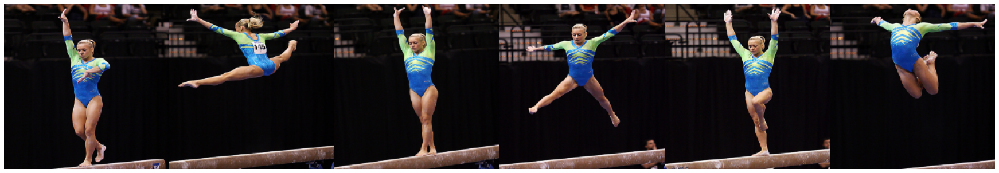

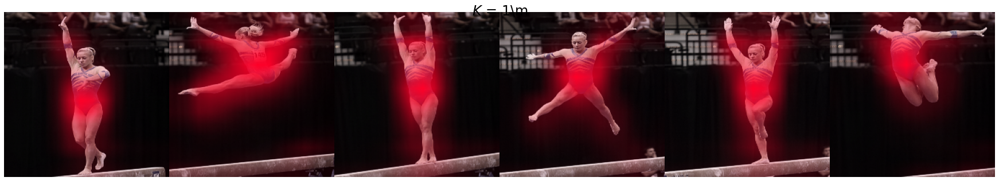

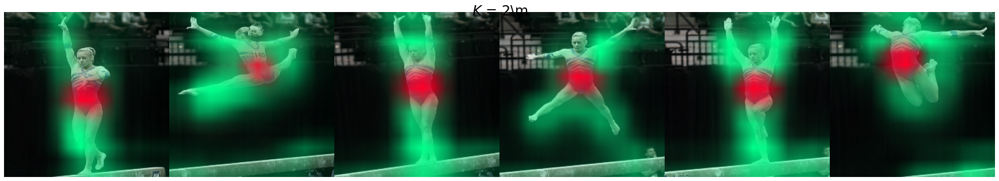

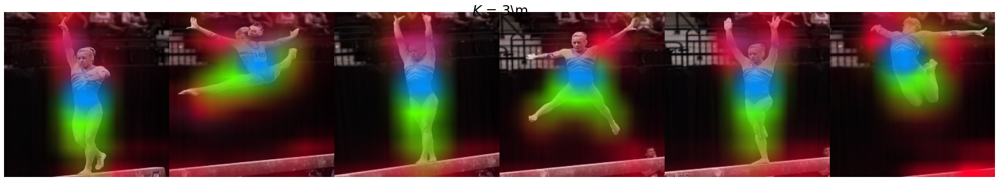

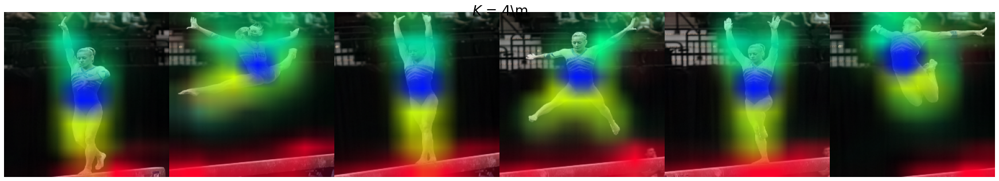

In [34]:
# 원본 이미지 시각화
show_heatmaps(raw_images, None, K = 0, enhance = 1)

# NMF를 k = 1, 2, 3, 4에 대하여 시행한다. (factor들의 순서는 무작위이며 매 iterations마다 일관적이진 않다)
for K in range(1, 5):
    with torch.no_grad():
        W, _ = NMF(flat_features, K, random_seed = 0, cuda = cuda, max_iter = 50)
    
    heatmaps = W.cpu().reshape(features.size(0), features.size(2), features.size(3), K).permute(0, 3, 1, 2)   # (num_examples, K, height, width)
    # 시각화를 위해서 224 x 224 해상도로 bilinear upasmpling을 진행한다
    heatmaps = torch.nn.functional.interpolate(heatmaps, size = (224, 224), mode = 'bilinear', align_corners = False)
    # height, width 축으로 정규화 진행
    heatmaps /= heatmaps.max(dim = 3, keepdim = True)[0].max(dim = 2, keepdim = True)[0]
    heatmaps = heatmaps.cpu().numpy()

    # heat map 시각화
    show_heatmaps(raw_images, heatmaps, K, title = f'$K$ = {K}', enhance = 0.3)

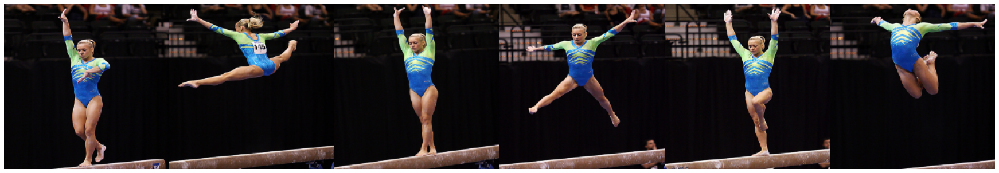

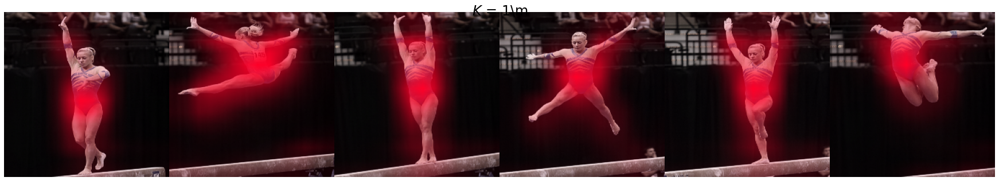

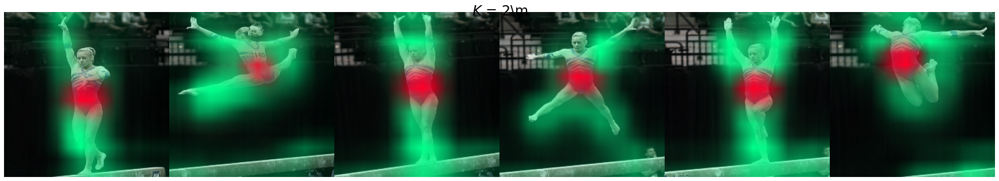

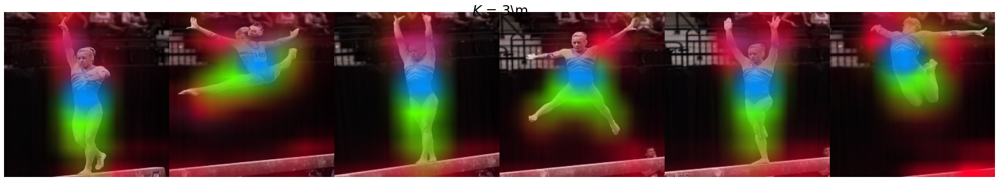

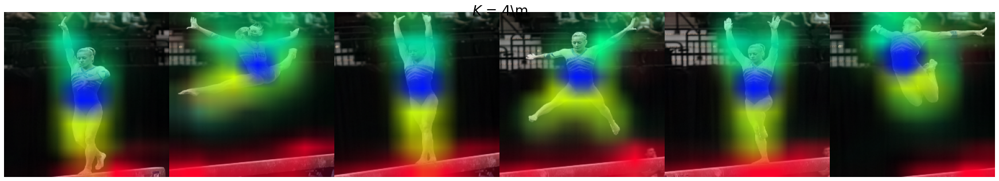

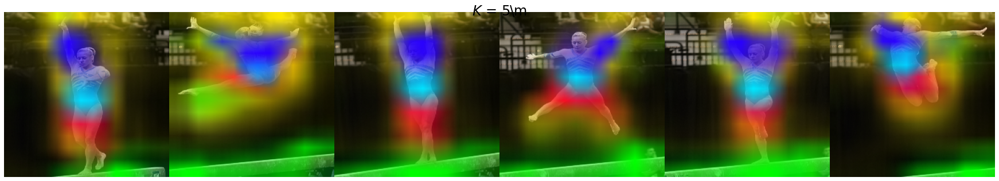

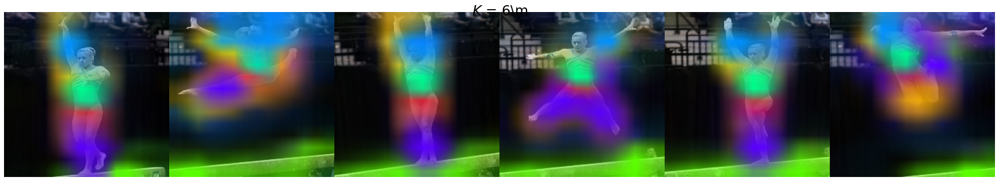

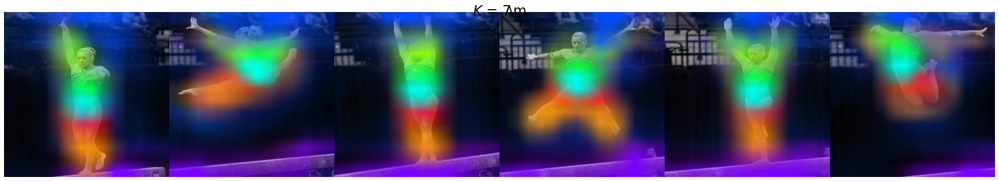

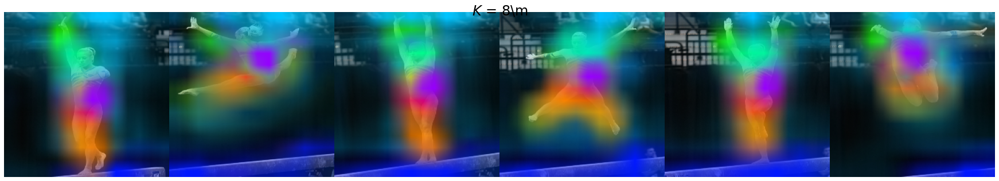

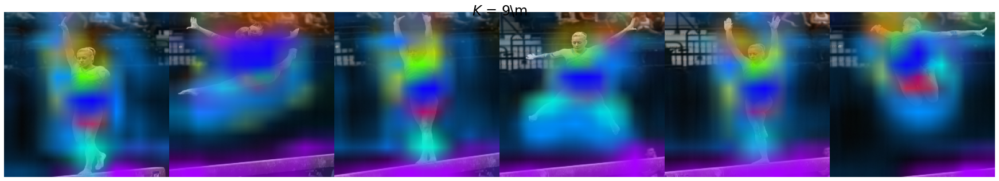

In [33]:
# 원본 이미지 시각화
show_heatmaps(raw_images, None, K = 0, enhance = 1)

# NMF를 k = 1, 2, 3, 4, ... , 10에 대하여 시행한다. (factor들의 순서는 무작위이며 매 iterations마다 일관적이진 않다)
for K in range(1, 10):
    with torch.no_grad():
        W, _ = NMF(flat_features, K, random_seed = 0, cuda = cuda, max_iter = 50)
    
    heatmaps = W.cpu().reshape(features.size(0), features.size(2), features.size(3), K).permute(0, 3, 1, 2)   # (num_examples, K, height, width)
    # 시각화를 위해서 224 x 224 해상도로 bilinear upasmpling을 진행한다
    heatmaps = torch.nn.functional.interpolate(heatmaps, size = (224, 224), mode = 'bilinear', align_corners = False)
    # height, width 축으로 정규화 진행
    heatmaps /= heatmaps.max(dim = 3, keepdim = True)[0].max(dim = 2, keepdim = True)[0]
    heatmaps = heatmaps.cpu().numpy()

    # heat map 시각화
    show_heatmaps(raw_images, heatmaps, K, title = f'$K$ = {K}', enhance = 0.3)
